# Model Input Visualization

Shows exactly what each model sees after its preprocessing pipeline,
and how lower-resolution inputs look after being upscaled by each processor.

| Model | Input size | Normalization |
|---|---|---|
| **SegGPT** | 448×448 (hard resize) | ImageNet |
| **DINOv2** | 256 shortest-edge → 224×224 center-crop | ImageNet |
| **Grounding DINO** | shortest-edge 800, longest ≤1333 | ImageNet |
| **SAM2** | 1024×1024 | ImageNet |
| **Qwen2.5-VL** | dynamic (multiples of 28, min/max pixel budget) | CLIP |

Only *processors* are loaded — no model weights.

In [27]:
%load_ext autoreload
%autoreload 2

import json
from pathlib import Path
import sys

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch

PROJECT_ROOT = Path.cwd().parent
sys.path.insert(0, str(PROJECT_ROOT))

from transformers import (
    AutoImageProcessor,
    AutoProcessor,
    GroundingDinoProcessor,
    Sam2Processor,
    SegGptImageProcessor,
)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Load processors

In [28]:
seggpt_processor = SegGptImageProcessor.from_pretrained("BAAI/seggpt-vit-large")
dinov2_processor = AutoImageProcessor.from_pretrained("facebook/dinov2-base")
gdino_processor  = GroundingDinoProcessor.from_pretrained("IDEA-Research/grounding-dino-tiny")
sam2_processor   = Sam2Processor.from_pretrained("facebook/sam2-hiera-small")
qwen_processor   = AutoProcessor.from_pretrained("Qwen/Qwen2.5-VL-3B-Instruct")

print("SegGPT  input size :", seggpt_processor.size)
print("DINOv2  input size : shortest_edge", dinov2_processor.size.shortest_edge,
      "→ crop", dinov2_processor.crop_size)
print("GDino   input size :", gdino_processor.image_processor.size)
print("SAM2    input size :", sam2_processor.image_processor.size)
print("Qwen    patch_size :", qwen_processor.image_processor.patch_size,
      "| merge_size:", qwen_processor.image_processor.merge_size)

SegGPT  input size : SizeDict(height=448, width=448, longest_edge=None, shortest_edge=None, max_height=None, max_width=None)
DINOv2  input size : shortest_edge 256 → crop SizeDict(height=224, width=224, longest_edge=None, shortest_edge=None, max_height=None, max_width=None)
GDino   input size : SizeDict(height=None, width=None, longest_edge=1333, shortest_edge=800, max_height=None, max_width=None)
SAM2    input size : SizeDict(height=1024, width=1024, longest_edge=None, shortest_edge=None, max_height=None, max_width=None)
Qwen    patch_size : 14 | merge_size: 2


## Load a sample

In [29]:
GH_MASKS = PROJECT_ROOT / "data" / "greatest_hits" / "masks"


def resolve_hand_path(s: dict) -> Path | None:
    """Return the hand/stick mask path that exists on disk.

    Some manifests list hand_mask_path but only _stick.png files were written,
    and vice-versa. Tries both keys, then falls back to probing the image stem.
    """
    for key in ("hand_mask_path", "stick_mask_path"):
        val = s.get(key)
        if val and Path(val).exists():
            return Path(val)
    img_stem = Path(s.get("image_path", "")).stem
    folder   = Path(s.get("image_path", "")).parent
    for suffix in ("_stick.png", "_hand.png"):
        candidate = folder / (img_stem + suffix)
        if candidate.exists():
            return candidate
    return None


sample, hand_path = None, None
for folder in sorted(GH_MASKS.iterdir()):
    manifest_path = folder / "manifest.json"
    if not manifest_path.exists():
        continue
    for frame in json.loads(manifest_path.read_text()).get("frames", []):
        p = resolve_hand_path(frame)
        if p is not None:
            sample, hand_path = frame, p
            break
    if sample:
        break

assert sample is not None, "No usable sample found — check GH_MASKS path"

img_pil  = Image.open(sample["image_path"]).convert("RGB")
img_np   = np.array(img_pil)
hand_np  = np.array(Image.open(hand_path).convert("L"))
obj_np   = np.array(Image.open(sample["object_mask_path"]).convert("L"))
touch_np = np.array(Image.open(sample["touch_mask_path"]).convert("L"))

print(f"Image : {img_np.shape}  —  {sample['image_path']}")
print(f"Hand  : {hand_path}")

Image : (256, 456, 3)  —  /home/doterog/repos/uva/research/FOMO/touch_from_segmentation/data/greatest_hits/masks/2015-02-16-16-49-06_denoised/frame_000080.jpg
Hand  : /home/doterog/repos/uva/research/FOMO/touch_from_segmentation/data/greatest_hits/masks/2015-02-16-16-49-06_denoised/frame_000080_stick.png


## Helpers

In [30]:
IMAGENET_MEAN = np.array([0.485, 0.456, 0.406], dtype=np.float32)
IMAGENET_STD  = np.array([0.229, 0.224, 0.225], dtype=np.float32)
CLIP_MEAN     = np.array([0.48145466, 0.4578275,  0.40821073], dtype=np.float32)
CLIP_STD      = np.array([0.26862954, 0.26130258, 0.27577711], dtype=np.float32)


def denorm(tensor_chw, mean=IMAGENET_MEAN, std=IMAGENET_STD) -> np.ndarray:
    """CHW float tensor → HWC uint8, undoing /255 + normalisation."""
    arr = tensor_chw.numpy().transpose(1, 2, 0)
    arr = arr * std + mean
    return np.clip(arr * 255, 0, 255).astype(np.uint8)


def qwen_reconstruct(pixel_values: torch.Tensor, image_grid_thw: torch.Tensor) -> np.ndarray:
    """Reconstruct a visible image from Qwen's flattened patch tensor.

    pixel_values: (num_patches, C * temporal_patch_size * patch_h * patch_w)
    image_grid_thw: (1, 3) tensor with [temporal, height_patches, width_patches]
    """
    t, h, w = image_grid_thw[0].tolist()
    C, tp, ph, pw = 3, 2, 14, 14  # Qwen2.5-VL constants
    pv = pixel_values.reshape(t, h, w, C, tp, ph, pw)
    pv = pv[0, :, :, :, 0, :, :]          # first image, first temporal frame → (h, w, C, ph, pw)
    pv = pv.permute(2, 0, 3, 1, 4)         # (C, h, ph, w, pw)
    pv = pv.reshape(C, int(h * ph), int(w * pw))  # (C, H, W)
    return denorm(pv, mean=CLIP_MEAN, std=CLIP_STD)


def show_pair(original: np.ndarray, processed: np.ndarray, title: str) -> None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    axes[0].imshow(original)
    axes[0].set_title(f"Original\n{original.shape[1]}×{original.shape[0]}px")
    axes[0].axis("off")
    axes[1].imshow(processed)
    axes[1].set_title(f"Model input (denorm)\n{processed.shape[1]}×{processed.shape[0]}px")
    axes[1].axis("off")
    fig.suptitle(title, fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.show()


def show_resolution_grid(img_pil, scales, process_fn, model_name, denorm_fn=None) -> None:
    """Row per scale: left = downscaled input, right = what model sees."""
    if denorm_fn is None:
        denorm_fn = lambda t: denorm(t)
    orig_w, orig_h = img_pil.size
    n = len(scales)
    fig, axes = plt.subplots(n, 2, figsize=(10, 4 * n))
    if n == 1:
        axes = [axes]
    for row, scale in enumerate(scales):
        new_w = max(1, int(orig_w * scale))
        new_h = max(1, int(orig_h * scale))
        small = img_pil.resize((new_w, new_h), Image.LANCZOS)
        processed = denorm_fn(process_fn(small))
        axes[row][0].imshow(small)
        axes[row][0].set_title(f"Input {int(scale*100)}%  →  {new_w}×{new_h}px")
        axes[row][0].axis("off")
        axes[row][1].imshow(processed)
        axes[row][1].set_title(f"{model_name} sees\n{processed.shape[1]}×{processed.shape[0]}px")
        axes[row][1].axis("off")
    fig.suptitle(f"{model_name} — resolution degradation", fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.show()

---
## SegGPT — 448×448

**Important:** `touch_dataset.py` calls the processor with *only images* (`images=`, `prompt_images=`).  
Masks are handled manually: resized with `NEAREST` then ImageNet-normalized as RGB tensors.  
The cell below replicates both pipelines.

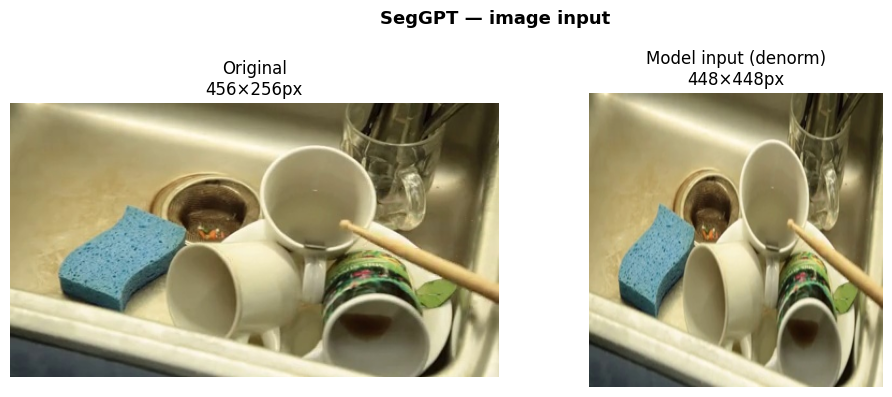

pixel_values range: -2.001 → 2.429


In [36]:
# --- Image pipeline (matches touch_dataset.py) ---
img_inputs = seggpt_processor(
    images=img_pil,
    prompt_images=img_pil,   # using same image as its own prompt for illustration
    return_tensors="pt",
)
# pixel_values: (1, C, 2*H, W) — top half=prompt, bottom half=query
pv = img_inputs["pixel_values"][0]
H  = pv.shape[1] // 2
query_vis = denorm(pv[:, :, :])   # bottom half = query

show_pair(img_np, query_vis, "SegGPT — image input")
print(f"pixel_values range: {pv.min():.3f} → {pv.max():.3f}")

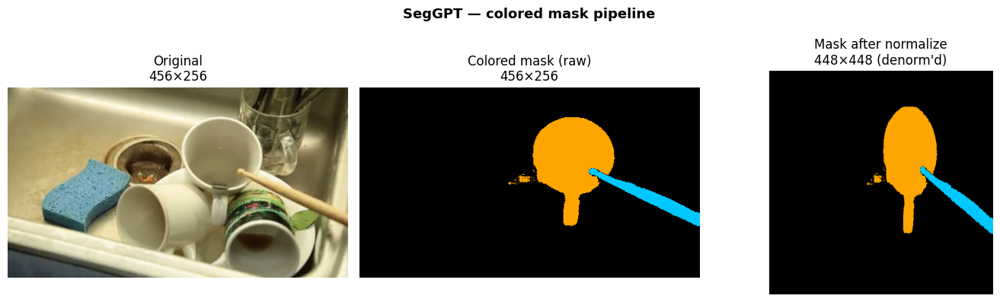

In [37]:
# --- Colored mask pipeline (matches touch_dataset._normalize_colored_mask) ---
# touch_dataset paints hand/object/touch with random colors, then normalizes manually.
TOUCH_COLOR = (255, 0, 0)  # fixed bright red
color_a = (0, 200, 255)    # example hand color
color_b = (255, 165, 0)    # example object color

mask_rgb = np.zeros((*hand_np.shape, 3), dtype=np.uint8)
mask_rgb[hand_np  > 0] = color_a
mask_rgb[obj_np   > 0] = color_b
mask_rgb[touch_np > 0] = TOUCH_COLOR
mask_pil = Image.fromarray(mask_rgb, mode="RGB")

# Exactly what _normalize_colored_mask does:
mask_resized = mask_pil.resize((448, 448), Image.NEAREST)
mask_arr = np.array(mask_resized).astype(np.float32) / 255.0
mask_norm = (mask_arr - IMAGENET_MEAN) / IMAGENET_STD
mask_tensor = torch.from_numpy(mask_norm).permute(2, 0, 1).float()
mask_vis = denorm(mask_tensor)

fig, axes = plt.subplots(1, 3, figsize=(14, 4))
axes[0].imshow(img_np);        axes[0].set_title(f"Original\n{img_np.shape[1]}×{img_np.shape[0]}"); axes[0].axis("off")
axes[1].imshow(mask_rgb);      axes[1].set_title(f"Colored mask (raw)\n{mask_rgb.shape[1]}×{mask_rgb.shape[0]}"); axes[1].axis("off")
axes[2].imshow(mask_vis);      axes[2].set_title(f"Mask after normalize\n448×448 (denorm'd)"); axes[2].axis("off")
fig.suptitle("SegGPT — colored mask pipeline", fontsize=13, fontweight="bold")
plt.tight_layout(); plt.show()

### SegGPT — resolution grid

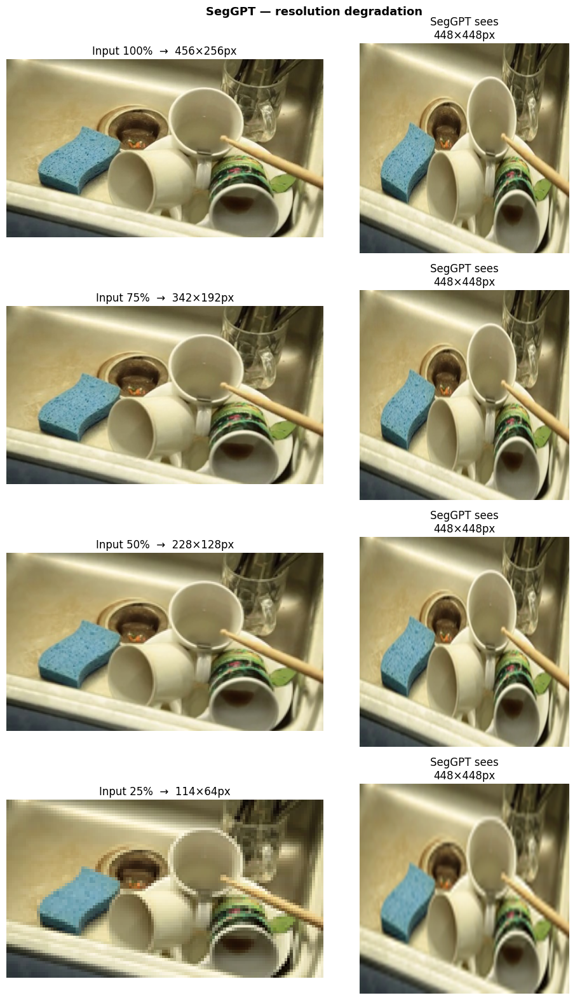

In [38]:
def seggpt_process(pil_img):
    inputs = seggpt_processor(images=pil_img, prompt_images=pil_img, return_tensors="pt")
    pv = inputs["pixel_values"][0]
    return pv[:, :, :]  # query half

show_resolution_grid(img_pil, [1.0, 0.75, 0.5, 0.25], seggpt_process, "SegGPT")

---
## DINOv2 — 256 shortest-edge → 224×224 center-crop

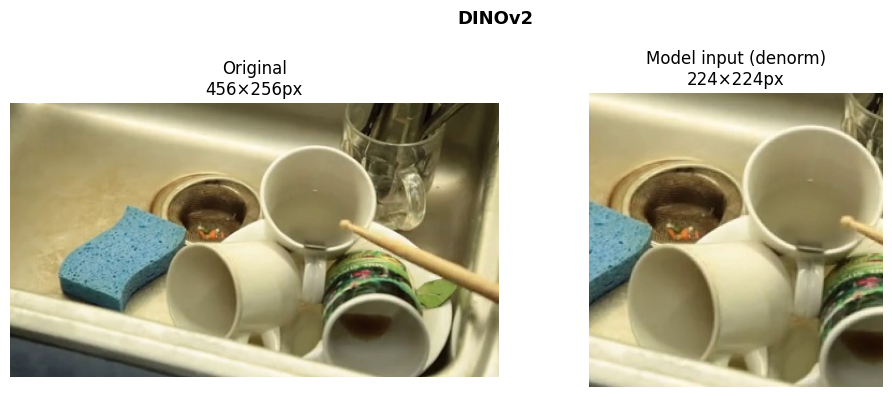

pixel_values range: -1.966 → 2.411


In [39]:
dinov2_inputs = dinov2_processor(images=img_pil, return_tensors="pt")
dinov2_vis = denorm(dinov2_inputs["pixel_values"][0])
show_pair(img_np, dinov2_vis, "DINOv2")
print(f"pixel_values range: {dinov2_inputs['pixel_values'].min():.3f} → {dinov2_inputs['pixel_values'].max():.3f}")

### DINOv2 — resolution grid

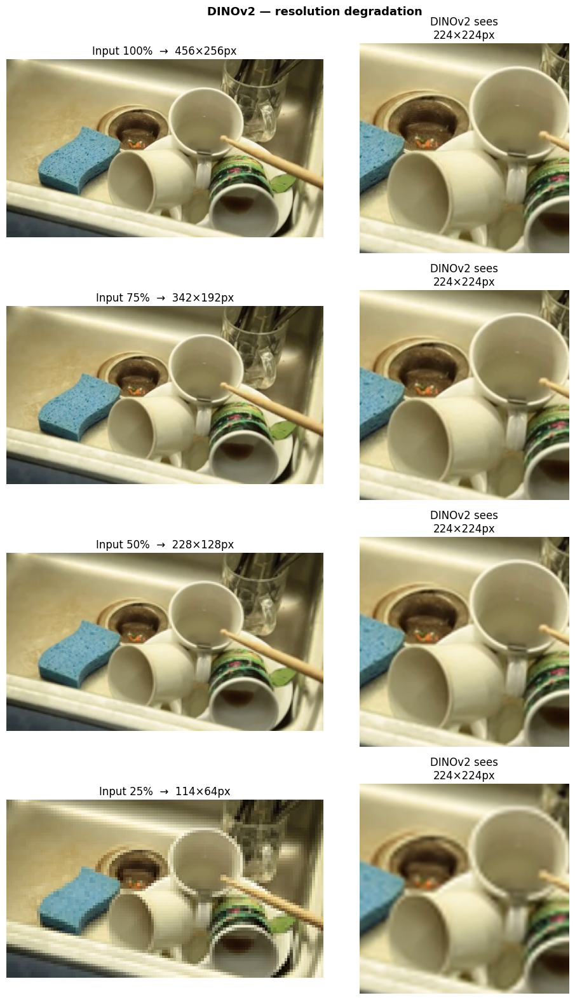

In [40]:
def dinov2_process(pil_img):
    return dinov2_processor(images=pil_img, return_tensors="pt")["pixel_values"][0]

show_resolution_grid(img_pil, [1.0, 0.75, 0.5, 0.25], dinov2_process, "DINOv2")

---
## Grounding DINO — shortest-edge 800, longest ≤1333

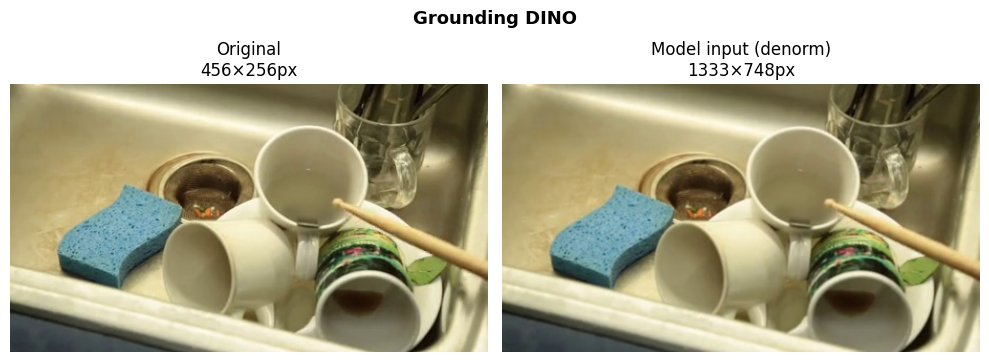

pixel_values range: -2.001 → 2.394


In [42]:
gdino_inputs = gdino_processor(images=img_pil, text="object", return_tensors="pt")
gdino_vis = denorm(gdino_inputs["pixel_values"][0])
show_pair(img_np, gdino_vis, "Grounding DINO")
print(f"pixel_values range: {gdino_inputs['pixel_values'].min():.3f} → {gdino_inputs['pixel_values'].max():.3f}")

### Grounding DINO — resolution grid

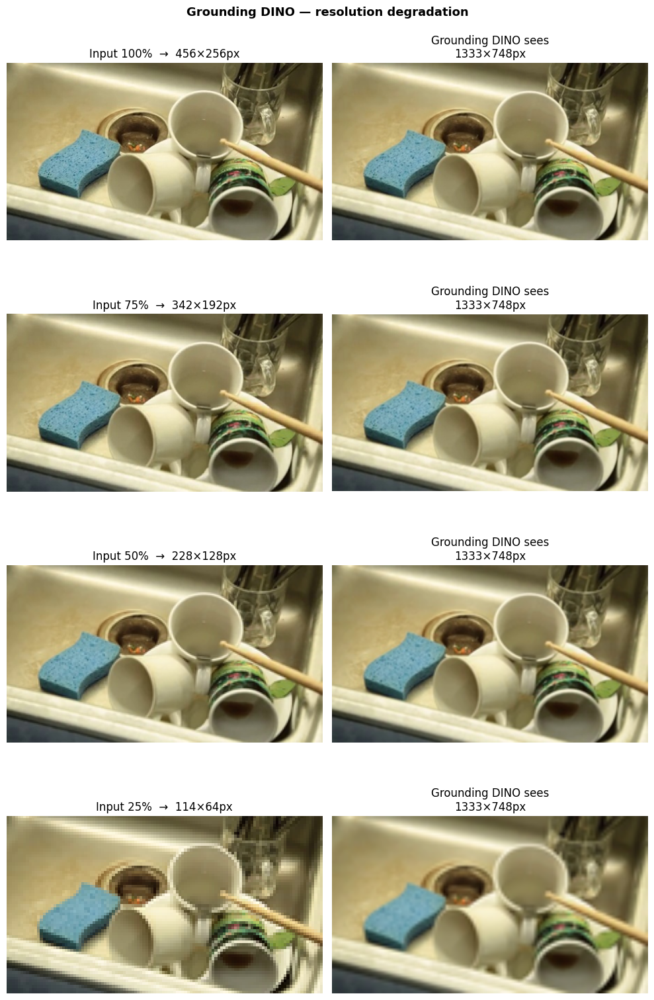

In [43]:
def gdino_process(pil_img):
    return gdino_processor(images=pil_img, text="object", return_tensors="pt")["pixel_values"][0]

show_resolution_grid(img_pil, [1.0, 0.75, 0.5, 0.25], gdino_process, "Grounding DINO")

---
## SAM2 — 1024×1024

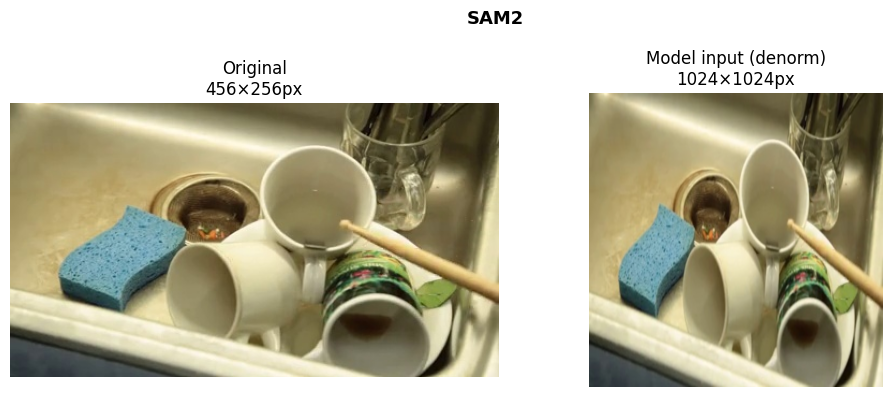

pixel_values range: -2.001 → 2.394


In [44]:
sam2_inputs = sam2_processor(images=img_pil, return_tensors="pt")
sam2_vis = denorm(sam2_inputs["pixel_values"][0])
show_pair(img_np, sam2_vis, "SAM2")
print(f"pixel_values range: {sam2_inputs['pixel_values'].min():.3f} → {sam2_inputs['pixel_values'].max():.3f}")

### SAM2 — resolution grid

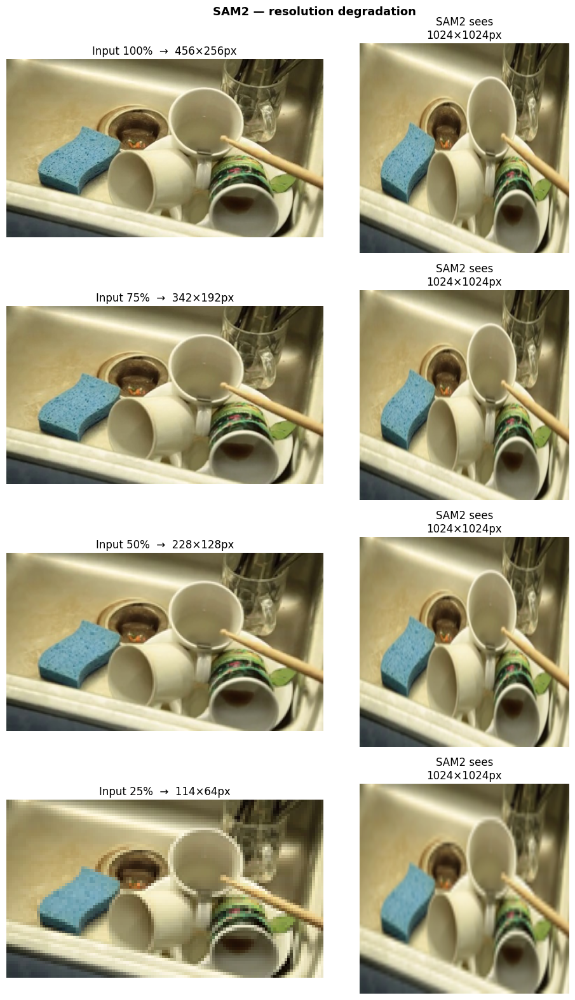

In [45]:
def sam2_process(pil_img):
    return sam2_processor(images=pil_img, return_tensors="pt")["pixel_values"][0]

show_resolution_grid(img_pil, [1.0, 0.75, 0.5, 0.25], sam2_process, "SAM2")

---
## Qwen2.5-VL — dynamic resolution (multiples of 28px)

Unlike the others, Qwen2.5-VL outputs flattened patch tensors `(N_patches, C·t·14·14)`.
We reconstruct the visible image using `image_grid_thw` which records `(t, h_patches, w_patches)`.

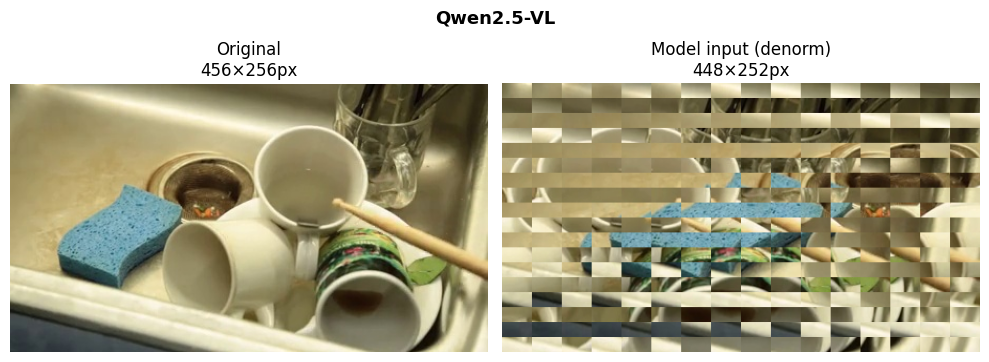

Patch grid (t, h, w): (1, 18, 32)  →  reconstructed 448×252px
pixel_values shape: torch.Size([576, 1176])
pixel_values range: -1.722 → 2.045


In [46]:
# Qwen needs chat-formatted text input alongside the image
messages = [{"role": "user", "content": [{"type": "image"}, {"type": "text", "text": "describe"}]}]
chat_text = qwen_processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)

qwen_inputs = qwen_processor(text=[chat_text], images=[img_pil], return_tensors="pt")
qwen_vis = qwen_reconstruct(qwen_inputs["pixel_values"], qwen_inputs["image_grid_thw"])

show_pair(img_np, qwen_vis, "Qwen2.5-VL")
t, h, w = qwen_inputs["image_grid_thw"][0].tolist()
print(f"Patch grid (t, h, w): ({t}, {h}, {w})  →  reconstructed {w*14}×{h*14}px")
print(f"pixel_values shape: {qwen_inputs['pixel_values'].shape}")
print(f"pixel_values range: {qwen_inputs['pixel_values'].min():.3f} → {qwen_inputs['pixel_values'].max():.3f}")

### Qwen2.5-VL — resolution grid

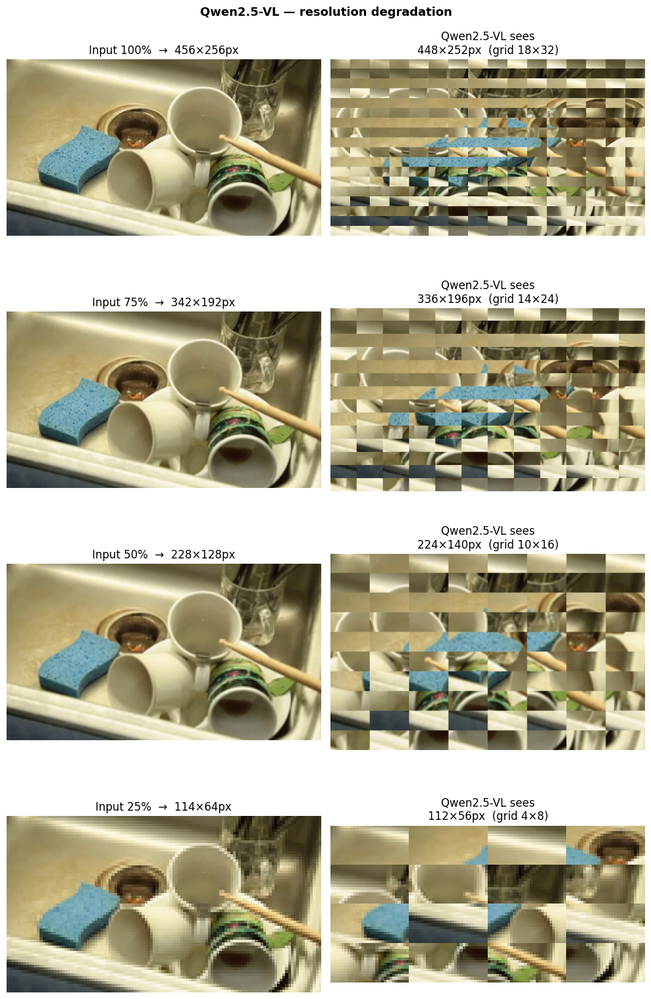

In [47]:
def qwen_process(pil_img):
    """Returns (pixel_values, image_grid_thw) tuple."""
    inputs = qwen_processor(text=[chat_text], images=[pil_img], return_tensors="pt")
    return (inputs["pixel_values"], inputs["image_grid_thw"])

def qwen_denorm_fn(result):
    pv, grid = result
    return qwen_reconstruct(pv, grid)

orig_w, orig_h = img_pil.size
n_scales = 4
scales = [1.0, 0.75, 0.5, 0.25]
fig, axes = plt.subplots(n_scales, 2, figsize=(10, 4 * n_scales))

for row, scale in enumerate(scales):
    new_w = max(1, int(orig_w * scale))
    new_h = max(1, int(orig_h * scale))
    small = img_pil.resize((new_w, new_h), Image.LANCZOS)
    pv, grid = qwen_process(small)
    vis = qwen_reconstruct(pv, grid)
    t, h, w = grid[0].tolist()

    axes[row][0].imshow(small)
    axes[row][0].set_title(f"Input {int(scale*100)}%  →  {new_w}×{new_h}px")
    axes[row][0].axis("off")
    axes[row][1].imshow(vis)
    axes[row][1].set_title(f"Qwen2.5-VL sees\n{w*14}×{h*14}px  (grid {h}×{w})")
    axes[row][1].axis("off")

fig.suptitle("Qwen2.5-VL — resolution degradation", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()

---
## All models side-by-side at one resolution

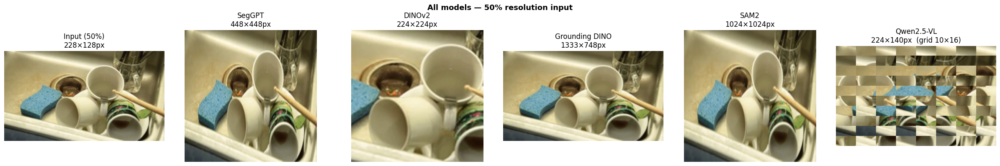

In [48]:
SCALE = 0.5  # ← change this

orig_w, orig_h = img_pil.size
small = img_pil.resize((max(1, int(orig_w * SCALE)), max(1, int(orig_h * SCALE))), Image.LANCZOS)

seggpt_out = denorm(seggpt_process(small))
dinov2_out = denorm(dinov2_process(small))
gdino_out  = denorm(gdino_process(small))
sam2_out   = denorm(sam2_process(small))
qwen_pv, qwen_grid = qwen_process(small)
qwen_out   = qwen_reconstruct(qwen_pv, qwen_grid)
qt, qh, qw = qwen_grid[0].tolist()

images = [np.array(small), seggpt_out, dinov2_out, gdino_out, sam2_out, qwen_out]
titles = [
    f"Input ({int(SCALE*100)}%)\n{small.size[0]}×{small.size[1]}px",
    f"SegGPT\n{seggpt_out.shape[1]}×{seggpt_out.shape[0]}px",
    f"DINOv2\n{dinov2_out.shape[1]}×{dinov2_out.shape[0]}px",
    f"Grounding DINO\n{gdino_out.shape[1]}×{gdino_out.shape[0]}px",
    f"SAM2\n{sam2_out.shape[1]}×{sam2_out.shape[0]}px",
    f"Qwen2.5-VL\n{qw*14}×{qh*14}px  (grid {qh}×{qw})",
]

fig, axes = plt.subplots(1, 6, figsize=(24, 4))
for ax, img, title in zip(axes, images, titles):
    ax.imshow(img)
    ax.set_title(title)
    ax.axis("off")

fig.suptitle(f"All models — {int(SCALE*100)}% resolution input", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()